In [ ]:
#https://jmscslgroup.github.io/bagpy/bagpy_example.html

In [59]:
#import models
import numpy as np
import pandas as pd
import h5py
import sys, os
import rospy
# import roslibpy
from scipy.interpolate import interp1d
import rosbag
import math
import h5py
import matplotlib.pylab as plt
import bagpy
from bagpy import bagreader

#sys.path.insert(0, r'C:\Users\sanke\OneDrive\Documents\stereo events datasets\testing')
#from EventPreProcess import EventPreProcess
from std_msgs.msg import Float64, Bool
from geometry_msgs.msg import Pose, Vector3, PoseStamped
from sensor_msgs.msg import Image
from cv_bridge import CvBridge

from bagpy import bagreader

In [60]:
#parameters of processing
frequency = 10 #Hz
bag_file_name = "2_obj_1speed_linearrotate_lowlight_062height.bag"
h5_file_name = 'New.hdf5'
examples_per_edge = 1

In [61]:
bag_file = rosbag.Bag(bag_file_name)

frames = []
frames_ts = []
contact_status = []
contact_status_ts = []
contact_case = [] #0:No contact 1: center, 2:remainder of contacts as in list_of_rotations
contact_case_ts = []
bridge = CvBridge()

In [63]:
#parse rosbag

for topic, msg, t in bag_file.read_messages(topics=['/davis_left/image_raw', '/davis_left/events', '/davis_right/image_raw', '/davis_right/events', '/camera/aligned_depth_to_color/image_raw', '/camera/color/image_raw']):
    if topic == '/davis_left/image_raw':     
        cv_image = bridge.imgmsg_to_cv2(msg, desired_encoding='passthrough')
        if np.shape(cv_image) == (260, 346, 3):    
            davis_left_frames.append(cv_image)
            davis_left_frames_ts.append(t.to_nsec())
        else:
            print("wrong size:", np.shape(cv_image))

    elif topic == '/davis_left/events':
        for e in msg.events:
            event = [e.x, e.y, e.ts.to_nsec(), e.polarity]
            davis_left_events.append(event)

    elif topic == '/davis_right/image_raw':     
        cv_image = bridge.imgmsg_to_cv2(msg, desired_encoding='passthrough')
        if np.shape(cv_image) == (260, 346, 3):    
            davis_right_frames.append(cv_image)
            davis_right_frames_ts.append(t.to_nsec())
        else:
            print("wrong size:", np.shape(cv_image))

    elif topic == '/davis_right/events':
        for e in msg.events:
            event = [e.x, e.y, e.ts.to_nsec(), e.polarity]
            davis_right_events.append(event)

    
    elif topic == '/camera/aligned_depth_to_color/image_raw':     
        cv_image = bridge.imgmsg_to_cv2(msg, desired_encoding='passthrough')
        print("depth image shape")
        print(np.shape(cv_image))
        if np.shape(cv_image) == (480, 640):    
            depth_frames.append(cv_image)
            depth_frames_ts.append(t.to_nsec())
        else:
            print("wrong size:", np.shape(cv_image))

    
    elif topic == '/camera/color/image_raw':     
        cv_image = bridge.imgmsg_to_cv2(msg, desired_encoding='passthrough')
        if np.shape(cv_image) == (480, 640, 3):    
            d435_frames.append(cv_image)
            d435_frames_ts.append(t.to_nsec())
        else:
            print("wrong size:", np.shape(cv_image))


bag_file.close()

NameError: name 'davis_left_events' is not defined

In [16]:
plt.imshow(frames[1])
plt.show()

NameError: name 'frames' is not defined

## bagpy codes experiments

In [21]:
# get the list of topics
b = bagreader('5_obj_1speed_linearrotate_lowlight_082height.bag')
b.topic_table

[INFO]  Data folder 5_obj_1speed_linearrotate_lowlight_082height already exists. Not creating.


,Topics,Types,Message Count,Frequency
0,/camera/aligned_depth_to_color/image_raw,sensor_msgs/Image,66,14.973133
1,/camera/color/image_raw,sensor_msgs/Image,69,14.978347
2,/davis_left/events,dvs_msgs/EventArray,141,33.072239
3,/davis_left/image_raw,sensor_msgs/Image,39,8.342955
4,/davis_right/events,dvs_msgs/EventArray,140,33.007822
5,/davis_right/image_raw,sensor_msgs/Image,40,8.338809
6,/tcp/vel,geometry_msgs/Twist,209,51.219695
7,/tcp_pose,geometry_msgs/PoseStamped,209,50.319773


In [22]:
LASER_MSG = b.message_by_topic('/camera/color/image_raw')

In [25]:
LASER_MSG
df_laser = pd.read_csv(LASER_MSG)
df_laser

,Time,header.seq,header.stamp.secs,header.stamp.nsecs,header.frame_id,height,width,encoding,is_bigendian,step,data
0,1.649619e+09,12044,1649618514,979910612,camera_color_optical_frame,480,640,rgb8,0,1920,b'{egzdf{\\m\x7f`qmbhf[ad_kd_keZkaVgeYfg[hh\\i...
1,1.649619e+09,12045,1649618515,47102690,camera_color_optical_frame,480,640,rgb8,0,1920,b'kfdhcaeadd`cg^ad[^TY`Z_fkb]md_kbOg^Kc[AaY?`Z...
2,1.649619e+09,12046,1649618515,114295006,camera_color_optical_frame,480,640,rgb8,0,1920,b'dhvdhvhebifceadc_bf\\hj`lmbhi^d```XXXTMVUNWl...
3,1.649619e+09,12047,1649618515,181487083,camera_color_optical_frame,480,640,rgb8,0,1920,b'tntpjphhhfffm^]j[ZiXfhWe[Yd[Yde`\\fa]gZ^bUYW...
4,1.649619e+09,12048,1649618515,248678923,camera_color_optical_frame,480,640,rgb8,0,1920,b'wngtkdlbblbbnaij]erYex_ku[YnTReWQcUOePMiTQd\...
...,...,...,...,...,...,...,...,...,...,...,...
64,1.649619e+09,12108,1649618519,282325745,camera_color_optical_frame,480,640,rgb8,0,1920,b'WNEXOFOFII@CQFN^S[\x86\x85\x87\x8c\x8b\x8d\x...
65,1.649619e+09,12109,1649618519,350036860,camera_color_optical_frame,480,640,rgb8,0,1920,b'jDUhBSa>N_<L`@GfFM\x80\x88}\x85\x8d\x82{\x92...
66,1.649619e+09,12110,1649618519,417754173,camera_color_optical_frame,480,640,rgb8,0,1920,b'fFKgGLeAE`<@SAKO=G\x84\x8c\x89\x8c\x94\x91\x...
67,1.649619e+09,12111,1649618519,485477686,camera_color_optical_frame,480,640,rgb8,0,1920,b'HPQJRSSJMMDGHAJNGPw~\x86\x92\x99\xa1\x8d\x93...


In [26]:
b.bagfile

'5_obj_1speed_linearrotate_lowlight_082height.bag'

In [27]:
b.datafolder

'5_obj_1speed_linearrotate_lowlight_082height'

In [28]:
b.frequency

[14.973133134848387,
 14.978346537535108,
 33.07223875889531,
 8.342955348333916,
 33.007822460061384,
 8.338808634832779,
 51.21969507317878,
 50.31977253368205]

In [33]:
ms = b.vel_data()

In [34]:
vel = pd.read_csv(ms[0])
vel.columns.values[1:].tolist()

['linear.x', 'linear.y', 'linear.z', 'angular.x', 'angular.y', 'angular.z']

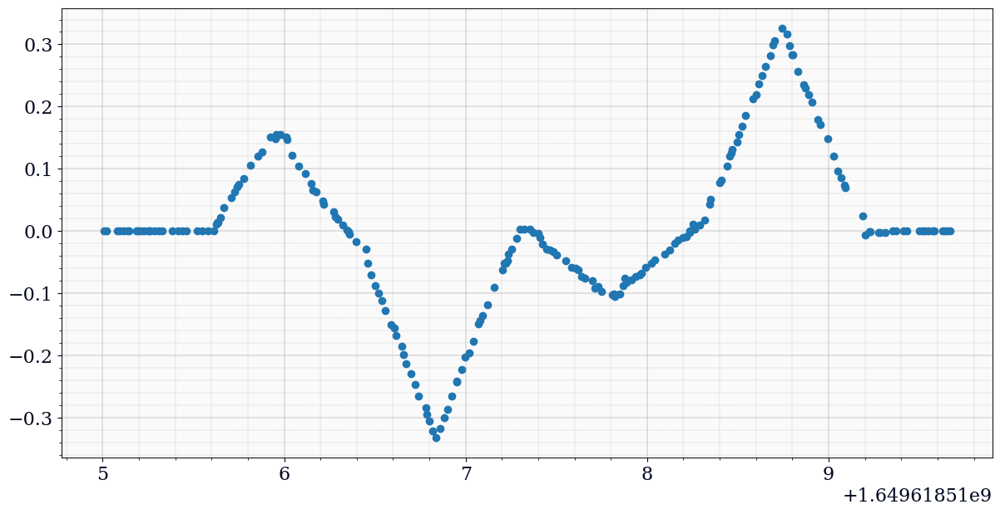

In [37]:
fig, ax = bagpy.create_fig(1)
ax[0].scatter(x='Time', y='linear.x', data=vel)
plt.show()

In [38]:
s = b.std_data()
s

[]

In [40]:
odom = b.odometry_data()

In [41]:
odom

[]

In [42]:
w = b.wrench_data()
w

[]

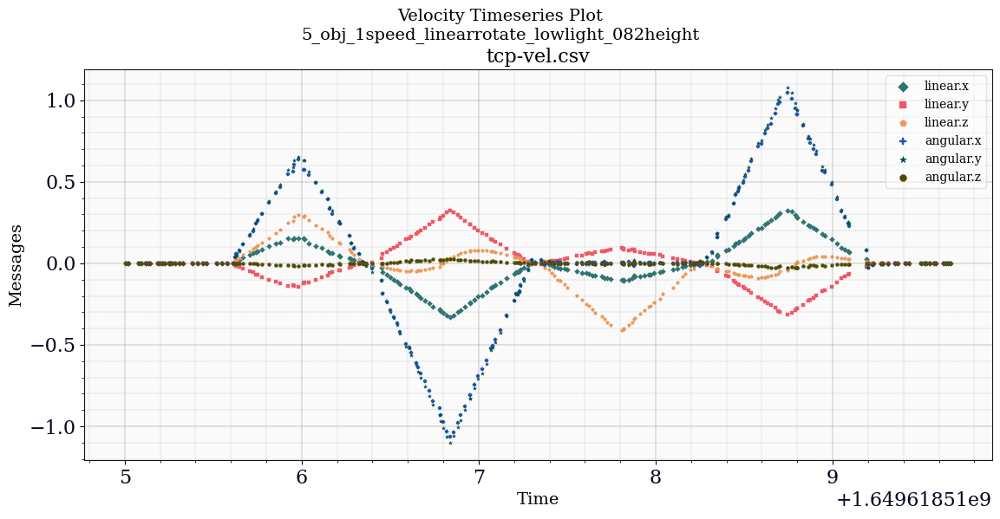

In [43]:
b.plot_vel(save_fig=True)

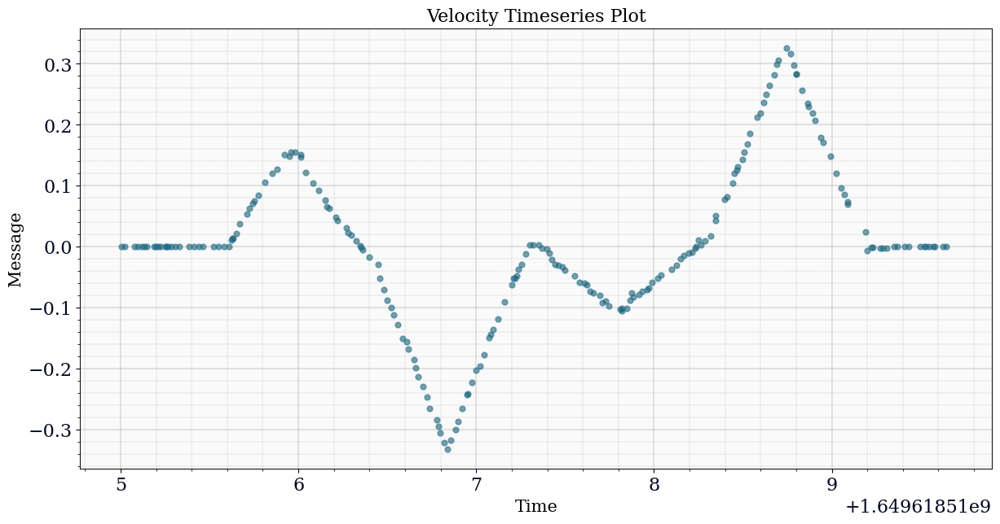

In [46]:
bagpy.animate_timeseries(vel['Time'], vel['linear.x'], title='Velocity Timeseries Plot')

In [47]:
csvfiles = []
for t in b.topics:
    data = b.message_by_topic(t)
    csvfiles.append(data)

In [48]:
csvfiles

['5_obj_1speed_linearrotate_lowlight_082height/camera-aligned_depth_to_color-image_raw.csv',
 '5_obj_1speed_linearrotate_lowlight_082height/camera-color-image_raw.csv',
 '5_obj_1speed_linearrotate_lowlight_082height/davis_left-events.csv',
 '5_obj_1speed_linearrotate_lowlight_082height/davis_left-image_raw.csv',
 '5_obj_1speed_linearrotate_lowlight_082height/davis_right-events.csv',
 '5_obj_1speed_linearrotate_lowlight_082height/davis_right-image_raw.csv',
 '5_obj_1speed_linearrotate_lowlight_082height/tcp-vel.csv',
 '5_obj_1speed_linearrotate_lowlight_082height/tcp_pose.csv']

In [49]:
print(csvfiles[0])
data = pd.read_csv(csvfiles[0])
data

5_obj_1speed_linearrotate_lowlight_082height/camera-aligned_depth_to_color-image_raw.csv


,Time,header.seq,header.stamp.secs,header.stamp.nsecs,header.frame_id,height,width,encoding,is_bigendian,step,data
0,1.649619e+09,12168,1649618514,979910612,camera_color_optical_frame,480,640,16UC1,0,1280,b'C\x03C\x03C\x03C\x03B\x03B\x03B\x03@\x03@\x0...
1,1.649619e+09,12169,1649618515,47102690,camera_color_optical_frame,480,640,16UC1,0,1280,b'F\x03F\x03E\x03E\x03E\x03E\x03E\x03E\x03E\x0...
2,1.649619e+09,12170,1649618515,114295006,camera_color_optical_frame,480,640,16UC1,0,1280,b'E\x03E\x03E\x03E\x03E\x03F\x03F\x03F\x03F\x0...
3,1.649619e+09,12171,1649618515,181487083,camera_color_optical_frame,480,640,16UC1,0,1280,b'E\x03E\x03E\x03E\x03E\x03E\x03E\x03E\x03E\x0...
4,1.649619e+09,12172,1649618515,248678923,camera_color_optical_frame,480,640,16UC1,0,1280,b'B\x03B\x03B\x03B\x03B\x03B\x03B\x03B\x03C\x0...
...,...,...,...,...,...,...,...,...,...,...,...
61,1.649619e+09,12229,1649618519,282325745,camera_color_optical_frame,480,640,16UC1,0,1280,b'H\x03J\x03J\x03K\x03L\x03L\x03M\x03M\x03M\x0...
62,1.649619e+09,12230,1649618519,350036860,camera_color_optical_frame,480,640,16UC1,0,1280,b'F\x03G\x03G\x03J\x03K\x03K\x03L\x03L\x03M\x0...
63,1.649619e+09,12231,1649618519,417754173,camera_color_optical_frame,480,640,16UC1,0,1280,b'G\x03H\x03H\x03K\x03K\x03K\x03L\x03L\x03M\x0...
64,1.649619e+09,12232,1649618519,485477686,camera_color_optical_frame,480,640,16UC1,0,1280,b'G\x03J\x03J\x03K\x03M\x03M\x03M\x03M\x03N\x0...


In [50]:
print(csvfiles[1])
data = pd.read_csv(csvfiles[1])
data

5_obj_1speed_linearrotate_lowlight_082height/camera-color-image_raw.csv


,Time,header.seq,header.stamp.secs,header.stamp.nsecs,header.frame_id,height,width,encoding,is_bigendian,step,data
0,1.649619e+09,12044,1649618514,979910612,camera_color_optical_frame,480,640,rgb8,0,1920,b'{egzdf{\\m\x7f`qmbhf[ad_kd_keZkaVgeYfg[hh\\i...
1,1.649619e+09,12045,1649618515,47102690,camera_color_optical_frame,480,640,rgb8,0,1920,b'kfdhcaeadd`cg^ad[^TY`Z_fkb]md_kbOg^Kc[AaY?`Z...
2,1.649619e+09,12046,1649618515,114295006,camera_color_optical_frame,480,640,rgb8,0,1920,b'dhvdhvhebifceadc_bf\\hj`lmbhi^d```XXXTMVUNWl...
3,1.649619e+09,12047,1649618515,181487083,camera_color_optical_frame,480,640,rgb8,0,1920,b'tntpjphhhfffm^]j[ZiXfhWe[Yd[Yde`\\fa]gZ^bUYW...
4,1.649619e+09,12048,1649618515,248678923,camera_color_optical_frame,480,640,rgb8,0,1920,b'wngtkdlbblbbnaij]erYex_ku[YnTReWQcUOePMiTQd\...
...,...,...,...,...,...,...,...,...,...,...,...
64,1.649619e+09,12108,1649618519,282325745,camera_color_optical_frame,480,640,rgb8,0,1920,b'WNEXOFOFII@CQFN^S[\x86\x85\x87\x8c\x8b\x8d\x...
65,1.649619e+09,12109,1649618519,350036860,camera_color_optical_frame,480,640,rgb8,0,1920,b'jDUhBSa>N_<L`@GfFM\x80\x88}\x85\x8d\x82{\x92...
66,1.649619e+09,12110,1649618519,417754173,camera_color_optical_frame,480,640,rgb8,0,1920,b'fFKgGLeAE`<@SAKO=G\x84\x8c\x89\x8c\x94\x91\x...
67,1.649619e+09,12111,1649618519,485477686,camera_color_optical_frame,480,640,rgb8,0,1920,b'HPQJRSSJMMDGHAJNGPw~\x86\x92\x99\xa1\x8d\x93...


In [51]:
print(csvfiles[2])
data = pd.read_csv(csvfiles[2])
data

5_obj_1speed_linearrotate_lowlight_082height/davis_left-events.csv


,Time,header.seq,header.stamp.secs,header.stamp.nsecs,header.frame_id,height,width,events
0,1.649619e+09,813876,1649618515,225981301,NaN,260,346,[x: 294\ny: 50\nts: \n secs: 1649618515\n ns...
1,1.649619e+09,813877,1649618515,255946301,NaN,260,346,[x: 250\ny: 17\nts: \n secs: 1649618515\n ns...
2,1.649619e+09,813878,1649618515,285924301,NaN,260,346,[x: 132\ny: 247\nts: \n secs: 1649618515\n n...
3,1.649619e+09,813879,1649618515,325915301,NaN,260,346,[x: 267\ny: 49\nts: \n secs: 1649618515\n ns...
4,1.649619e+09,813880,1649618515,355937301,NaN,260,346,[x: 286\ny: 49\nts: \n secs: 1649618515\n ns...
...,...,...,...,...,...,...,...,...
136,1.649619e+09,814012,1649618519,755946301,NaN,260,346,[x: 16\ny: 122\nts: \n secs: 1649618519\n ns...
137,1.649619e+09,814013,1649618519,785942301,NaN,260,346,[x: 0\ny: 238\nts: \n secs: 1649618519\n nse...
138,1.649619e+09,814014,1649618519,825931301,NaN,260,346,[x: 164\ny: 45\nts: \n secs: 1649618519\n ns...
139,1.649619e+09,814015,1649618519,855913301,NaN,260,346,[x: 142\ny: 179\nts: \n secs: 1649618519\n n...


In [52]:
print(csvfiles[3])
data = pd.read_csv(csvfiles[3])
data

5_obj_1speed_linearrotate_lowlight_082height/davis_left-image_raw.csv


,Time,header.seq,header.stamp.secs,header.stamp.nsecs,header.frame_id,height,width,encoding,is_bigendian,step,data
0,1.649619e+09,562650,1649618515,241123301,NaN,260,346,rgb8,0,1038,b'\x02\x02\x00\x02\x02\x00\x01\x05\x01\x01\x03...
1,1.649619e+09,562651,1649618515,359464301,NaN,260,346,rgb8,0,1038,b'\x02\x02\x00\x02\x02\x00\x01\x04\x01\x01\x02...
2,1.649619e+09,562652,1649618515,477805301,NaN,260,346,rgb8,0,1038,b'\x02\x03\x01\x02\x03\x01\x01\x04\x02\x01\x03...
3,1.649619e+09,562653,1649618515,596146301,NaN,260,346,rgb8,0,1038,b'\x02\x03\x01\x02\x03\x01\x01\x04\x02\x01\x02...
4,1.649619e+09,562654,1649618515,714487301,NaN,260,346,rgb8,0,1038,b'\x02\x03\x00\x02\x03\x00\x01\x04\x01\x01\x02...
5,1.649619e+09,562655,1649618515,832828301,NaN,260,346,rgb8,0,1038,b'\x03\x03\x00\x03\x03\x00\x02\x05\x02\x02\x03...
6,1.649619e+09,562656,1649618515,951169301,NaN,260,346,rgb8,0,1038,b'\x02\x02\x00\x02\x02\x00\x02\x04\x02\x02\x03...
7,1.649619e+09,562657,1649618516,69510301,NaN,260,346,rgb8,0,1038,b'\x01\x01\x00\x01\x01\x00\x00\x02\x01\x00\x01...
8,1.649619e+09,562658,1649618516,187852301,NaN,260,346,rgb8,0,1038,b'\x02\x02\x00\x02\x02\x00\x00\x04\x01\x01\x02...
9,1.649619e+09,562659,1649618516,306193301,NaN,260,346,rgb8,0,1038,b'\x01\x01\x00\x01\x01\x00\x00\x02\x01\x00\x01...


In [53]:
print(csvfiles[4])
data = pd.read_csv(csvfiles[4])
data

5_obj_1speed_linearrotate_lowlight_082height/davis_right-events.csv


,Time,header.seq,header.stamp.secs,header.stamp.nsecs,header.frame_id,height,width,events
0,1.649619e+09,813877,1649618515,235933301,NaN,260,346,[x: 186\ny: 49\nts: \n secs: 1649618515\n ns...
1,1.649619e+09,813878,1649618515,276014301,NaN,260,346,[x: 239\ny: 35\nts: \n secs: 1649618515\n ns...
2,1.649619e+09,813879,1649618515,305988301,NaN,260,346,[x: 259\ny: 46\nts: \n secs: 1649618515\n ns...
3,1.649619e+09,813880,1649618515,335924301,NaN,260,346,[x: 292\ny: 125\nts: \n secs: 1649618515\n n...
4,1.649619e+09,813881,1649618515,375957301,NaN,260,346,[x: 40\ny: 38\nts: \n secs: 1649618515\n nse...
...,...,...,...,...,...,...,...,...
135,1.649619e+09,814012,1649618519,735912301,NaN,260,346,[x: 226\ny: 94\nts: \n secs: 1649618519\n ns...
136,1.649619e+09,814013,1649618519,775914301,NaN,260,346,[x: 308\ny: 64\nts: \n secs: 1649618519\n ns...
137,1.649619e+09,814014,1649618519,805948301,NaN,260,346,[x: 339\ny: 254\nts: \n secs: 1649618519\n n...
138,1.649619e+09,814015,1649618519,835916301,NaN,260,346,[x: 279\ny: 259\nts: \n secs: 1649618519\n n...


In [54]:
print(csvfiles[5])
data = pd.read_csv(csvfiles[5])
data

5_obj_1speed_linearrotate_lowlight_082height/davis_right-image_raw.csv


,Time,header.seq,header.stamp.secs,header.stamp.nsecs,header.frame_id,height,width,encoding,is_bigendian,step,data
0,1.649619e+09,562335,1649618515,186005301,NaN,260,346,rgb8,0,1038,b'\x02\x03\x03\x02\x03\x03\x02\x06\x02\x02\x04...
1,1.649619e+09,562336,1649618515,304345301,NaN,260,346,rgb8,0,1038,b'\x02\x03\x04\x02\x03\x04\x02\x05\x02\x02\x04...
2,1.649619e+09,562337,1649618515,422686301,NaN,260,346,rgb8,0,1038,b'\x02\x03\x03\x02\x03\x03\x01\x05\x02\x01\x04...
3,1.649619e+09,562338,1649618515,541026301,NaN,260,346,rgb8,0,1038,b'\x02\x03\x03\x02\x03\x03\x01\x05\x01\x01\x04...
4,1.649619e+09,562339,1649618515,659367301,NaN,260,346,rgb8,0,1038,b'\x01\x03\x03\x01\x03\x03\x01\x06\x02\x01\x04...
5,1.649619e+09,562340,1649618515,777708301,NaN,260,346,rgb8,0,1038,b'\x01\x02\x03\x01\x02\x03\x00\x05\x01\x01\x04...
6,1.649619e+09,562341,1649618515,896048301,NaN,260,346,rgb8,0,1038,b'\x01\x03\x02\x01\x03\x02\x01\x05\x01\x01\x03...
7,1.649619e+09,562342,1649618516,14389301,NaN,260,346,rgb8,0,1038,b'\x02\x05\x04\x02\x05\x04\x01\x06\x02\x01\x03...
8,1.649619e+09,562343,1649618516,132730301,NaN,260,346,rgb8,0,1038,b'\x01\x03\x02\x01\x03\x02\x01\x05\x01\x01\x03...
9,1.649619e+09,562344,1649618516,251070301,NaN,260,346,rgb8,0,1038,b'\x00\x02\x02\x00\x02\x02\x00\x03\x01\x00\x03...


In [55]:
print(csvfiles[6])
data = pd.read_csv(csvfiles[6])
data

5_obj_1speed_linearrotate_lowlight_082height/tcp-vel.csv


,Time,linear.x,linear.y,linear.z,angular.x,angular.y,angular.z
0,1.649619e+09,0.000003,0.000004,-0.000001,0.000018,-0.000017,-0.000025
1,1.649619e+09,0.000003,0.000004,-0.000001,0.000018,-0.000017,-0.000025
2,1.649619e+09,0.000003,0.000004,-0.000001,0.000018,-0.000017,-0.000025
3,1.649619e+09,0.000003,0.000004,-0.000001,0.000018,-0.000017,-0.000025
4,1.649619e+09,0.000003,0.000004,-0.000001,0.000018,-0.000017,-0.000025
...,...,...,...,...,...,...,...
204,1.649619e+09,-0.000026,-0.000051,-0.000077,-0.000014,0.000004,-0.000097
205,1.649619e+09,-0.000025,-0.000047,-0.000066,-0.000005,0.000005,-0.000078
206,1.649619e+09,-0.000025,-0.000047,-0.000066,-0.000005,0.000005,-0.000078
207,1.649619e+09,-0.000025,-0.000042,-0.000056,-0.000009,-0.000009,-0.000079


In [56]:
print(csvfiles[7])
data = pd.read_csv(csvfiles[7])
data

5_obj_1speed_linearrotate_lowlight_082height/tcp_pose.csv


,Time,header.seq,header.stamp.secs,header.stamp.nsecs,header.frame_id,pose.position.x,pose.position.y,pose.position.z,pose.orientation.x,pose.orientation.y,pose.orientation.z,pose.orientation.w
0,1.649619e+09,1,1649618514,999376058,ur_base,0.058520,-0.548130,0.908453,-0.271702,-0.647171,0.663538,-0.258968
1,1.649619e+09,2,1649618515,16450881,ur_base,0.058498,-0.548132,0.908445,-0.271726,-0.647170,0.663538,-0.258947
2,1.649619e+09,3,1649618515,47597885,ur_base,0.058497,-0.548121,0.908457,-0.271716,-0.647170,0.663542,-0.258948
3,1.649619e+09,4,1649618515,81573963,ur_base,0.058522,-0.548096,0.908471,-0.271694,-0.647161,0.663557,-0.258954
4,1.649619e+09,5,1649618515,95299959,ur_base,0.058519,-0.548101,0.908460,-0.271687,-0.647186,0.663532,-0.258963
...,...,...,...,...,...,...,...,...,...,...,...,...
204,1.649619e+09,205,1649618519,577929019,ur_base,-0.043469,-0.444843,0.908443,-0.380309,-0.589928,0.698504,-0.139435
205,1.649619e+09,206,1649618519,604892969,ur_base,-0.043460,-0.444847,0.908436,-0.380297,-0.589941,0.698493,-0.139468
206,1.649619e+09,207,1649618519,627882957,ur_base,-0.043458,-0.444828,0.908471,-0.380290,-0.589900,0.698533,-0.139458
207,1.649619e+09,208,1649618519,648566961,ur_base,-0.043460,-0.444830,0.908461,-0.380310,-0.589917,0.698509,-0.139452


In [7]:
#interpolate contact status to meet proper time
# f = interp1d(contact_case_ts, contact_case, kind='previous')
f = interp1d(contact_case_ts, contact_case, kind='nearest') # previous is not supported anymore (nearest)

frame_ts_start_idx = np.min(np.nonzero([i > np.min(contact_case_ts) for i in frames_ts]))
frame_ts_end_idx = np.max(np.nonzero([i < np.max(contact_case_ts) for i in frames_ts]))
frame_ts_idx_org = range(frame_ts_start_idx, frame_ts_end_idx)
frame_ts_idx = [idx for idx in frame_ts_idx_org if idx % 3 == 0]

contact_case_ts_int = [frames_ts[idx] for idx in frame_ts_idx]
contact_case_int = f(contact_case_ts_int)
frames_int = [np.copy(frames[idx]) for idx in frame_ts_idx]

In [27]:
bag_file = rosbag.Bag(bag_file_name)

frames = []
frames_ts = []
contact_status = []
contact_status_ts = []
contact_case = [] #0:No contact 1: center, 2:remainder of contacts as in list_of_rotations
contact_case_ts = []
bridge = CvBridge()


#generate labels
possible_angle = [0.075, 0.15]
N_examples = 9
list_of_rotations = [[0, 0, 0]]

for i in range(1, N_examples):
    theta = i * 2 * math.pi/(N_examples - 1)
    for phi in possible_angle:
        rx = phi * math.cos(theta)
        ry = phi * math.sin(theta)
        rotvec = [rx, ry, 0]
        list_of_rotations.append(rotvec)

#TODO: remove this case
list_of_rotations[8] = [-0.15, 0, 0]

print(list_of_rotations)


[[0, 0, 0], [0.053033008588991064, 0.053033008588991064, 0], [0.10606601717798213, 0.10606601717798213, 0], [4.592425496802574e-18, 0.075, 0], [9.184850993605149e-18, 0.15, 0], [-0.05303300858899106, 0.053033008588991064, 0], [-0.10606601717798211, 0.10606601717798213, 0], [-0.075, 9.184850993605149e-18, 0], [-0.15, 0, 0], [-0.05303300858899108, -0.05303300858899106, 0], [-0.10606601717798216, -0.10606601717798211, 0], [-1.3777276490407722e-17, -0.075, 0], [-2.7554552980815445e-17, -0.15, 0], [0.05303300858899105, -0.05303300858899108, 0], [0.1060660171779821, -0.10606601717798216, 0], [0.075, -1.8369701987210297e-17, 0], [0.15, -3.6739403974420595e-17, 0]]


In [8]:
del frames

In [9]:
import gc
gc.collect()

2448

In [10]:
print(np.shape(frames_int))

(2480, 260, 346, 3)


40
7482


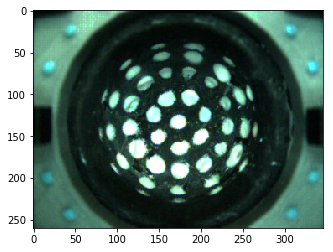

In [11]:
plt.imshow(frames_int[11])
print(frame_ts_start_idx)
print(frame_ts_end_idx)
plt.show()

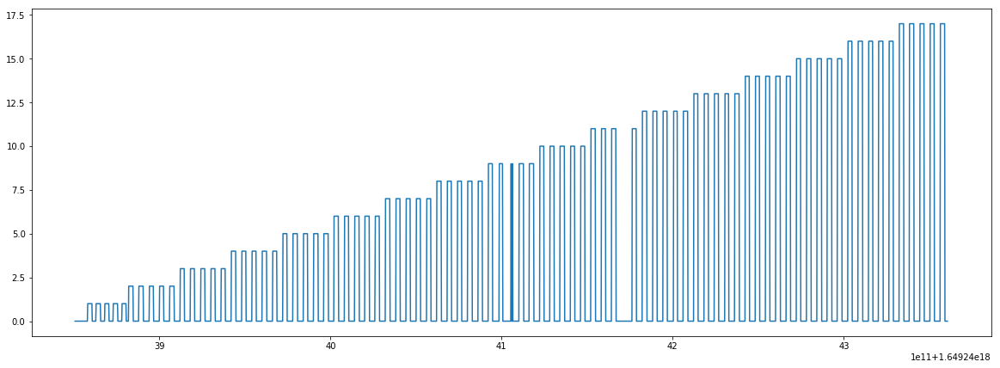

2480
2480


In [12]:
plt.figure(figsize=(20,7))
plt.plot(contact_case_ts_int, contact_case_int)
plt.show()
print(len(contact_case_ts_int))
print(len(frames_int))

In [13]:
del EventPreProcess
import EventPreProcess
reload(EventPreProcess)
from EventPreProcess import EventPreProcess

In [14]:
#Generate frames, crop and and store in h5 file
hf = h5py.File(h5_file_name, 'w')
hf.create_dataset('contact_status', data=contact_case_int)
hf.create_dataset('time_steps', data=contact_case_ts_int)

set_size = 1000

for i in range(0, len(contact_case_ts_int), set_size):
    start_idx=i
    end_idx=min([len(contact_case_ts_int), i+set_size])

    cropped_image = EventPreProcess.cropFrames(frames_int[start_idx:end_idx], circle_center=(175, 130), circle_rad=100, im_channels=3, expand_dims=False) # adjust to center

    #write data
    if i==0:
        print(np.shape(cropped_image))
        hf.create_dataset('frames', data=cropped_image, maxshape=(None,None, None, None))
    else:
        hf['frames'].resize(len(hf['frames']) + len(cropped_image), axis=0)
        hf["frames"][-len(cropped_image):] = cropped_image
    del cropped_image

del frames_int
hf.close()

(1000, 260, 346, 3)


In [15]:
# del frames_int # deleted above

In [16]:
import gc
gc.collect()

4796

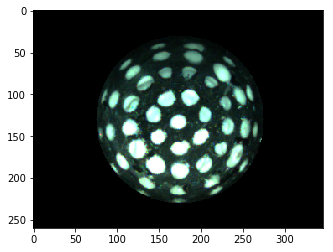

In [17]:
hf = h5py.File(h5_file_name, 'r')
fig = plt.figure()
plt.imshow(hf['frames'][100]/255)
plt.show()
fig.savefig('center.png')
hf.close()

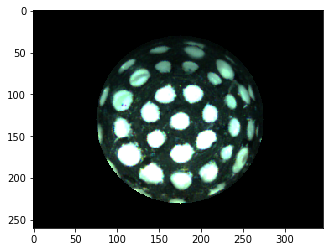

3.0
[7]


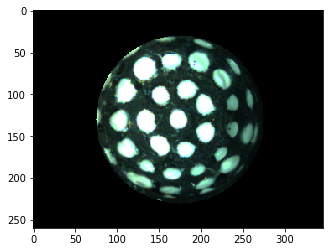

In [18]:
#Test camera rotation for augmentation
hf = h5py.File(h5_file_name, 'r+')
desired_status = 3
encounter = np.min(np.nonzero([i == desired_status for i in hf['contact_status']]))+10

original_image = hf['frames'][encounter]
original_contact_status = hf['contact_status'][encounter]
rot_90_image = EventPreProcess.rotateFrames([original_image], circle_center=(175, 130), rotate_angle=270) # changed from 177 to 175
rot_90_contact_status = EventPreProcess.updateContactStatus([original_contact_status], list_of_rotations, 270)

plt.imshow((original_image) / 255)
plt.show()
print(original_contact_status)
print(rot_90_contact_status)
plt.imshow((rot_90_image[0])/255)
plt.show()
hf.close()

In [19]:
#Augment images with rotation
hf = h5py.File(h5_file_name, 'r+')
set_size = 300

for i in range(0, len(hf['frames']), set_size):
    start_idx=i
    end_idx=min([len(hf['frames']), i+set_size])

    original_image = hf['frames'][start_idx:end_idx]
    original_contact_status = hf['contact_status'][start_idx:end_idx]

    rot_90_image = EventPreProcess.rotateFrames(original_image, circle_center=(177, 130), rotate_angle=90)
    rot_90_contact_status = EventPreProcess.updateContactStatus(original_contact_status, list_of_rotations, 90)

    rot_180_image = EventPreProcess.rotateFrames(original_image, circle_center=(177, 130), rotate_angle=180)
    rot_180_contact_status = EventPreProcess.updateContactStatus(original_contact_status, list_of_rotations, 180)

    rot_270_image = EventPreProcess.rotateFrames(original_image, circle_center=(177, 125), rotate_angle=270)
    rot_270_contact_status = EventPreProcess.updateContactStatus(original_contact_status, list_of_rotations, 270)


    #write data
    if i==0:
        hf.create_dataset('frames_augmented', data=np.concatenate((original_image, rot_90_image, rot_180_image, rot_270_image), axis=0), maxshape=(None,None, None, None))
        hf.create_dataset('contact_status_augmented', data=np.concatenate((original_contact_status, rot_90_contact_status, rot_180_contact_status, rot_270_contact_status), axis=0), maxshape=(None,))
    else:
        hf['frames_augmented'].resize(len(hf['frames_augmented']) + 4*len(original_image), axis=0)
        hf["frames_augmented"][-4*len(original_image):] = np.concatenate((original_image, rot_90_image, rot_180_image, rot_270_image), axis=0)

        hf['contact_status_augmented'].resize(len(hf['contact_status_augmented']) + 4*len(original_contact_status), axis=0)
        hf["contact_status_augmented"][-4*len(original_contact_status):] = np.concatenate((original_contact_status, rot_90_contact_status, rot_180_contact_status, rot_270_contact_status), axis=0)
    
    del rot_270_image, rot_180_image, rot_90_image, original_image
    del rot_270_contact_status, rot_180_contact_status, rot_90_contact_status, original_contact_status

hf.close()

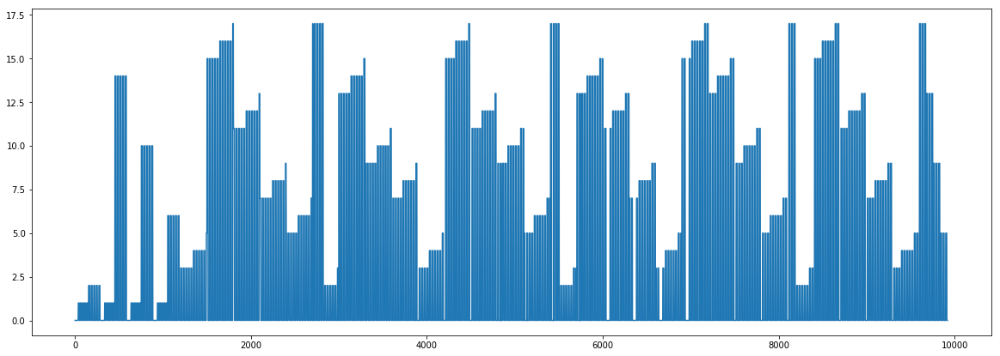

In [20]:
hf = h5py.File(h5_file_name, 'r')
plt.figure(figsize=(20,7))
plt.plot(hf["contact_status_augmented"])
plt.show()
hf.close()

In [21]:
hf = h5py.File(h5_file_name, 'r+')
print('number of total frames: {}'.format(len(hf['contact_status_augmented'])))
hf.close()

number of total frames: 9920


In [22]:
#Find rise/drop time and create windows accordingle
#Only take a sinle exmple from each case
hf = h5py.File(h5_file_name, 'r+')
edge_locations = np.where(np.diff(hf['contact_status_augmented'])>0)
edge_locations = np.array(edge_locations)[0].tolist()
print(edge_locations)
hf.close()

[35, 59, 84, 108, 133, 152, 181, 211, 240, 269, 335, 359, 384, 408, 433, 452, 481, 511, 540, 569, 635, 659, 684, 708, 733, 752, 781, 811, 840, 869, 935, 959, 984, 1008, 1033, 1052, 1081, 1111, 1140, 1169, 1199, 1228, 1257, 1286, 1315, 1344, 1374, 1403, 1432, 1462, 1491, 1499, 1528, 1557, 1586, 1615, 1644, 1674, 1703, 1732, 1762, 1791, 1828, 1857, 1886, 1915, 1944, 1974, 2003, 2032, 2062, 2091, 2128, 2157, 2186, 2215, 2244, 2274, 2303, 2332, 2362, 2391, 2419, 2449, 2478, 2507, 2536, 2566, 2595, 2624, 2653, 2682, 2699, 2719, 2749, 2778, 2807, 2836, 2866, 2895, 2924, 2953, 2982, 2999, 3019, 3049, 3078, 3107, 3136, 3166, 3195, 3224, 3253, 3282, 3299, 3319, 3349, 3378, 3407, 3436, 3466, 3495, 3524, 3553, 3582, 3612, 3641, 3670, 3699, 3727, 3757, 3786, 3815, 3845, 3874, 3912, 3941, 3970, 3999, 4027, 4057, 4086, 4115, 4145, 4174, 4212, 4241, 4270, 4299, 4327, 4357, 4386, 4415, 4445, 4474, 4512, 4541, 4570, 4599, 4627, 4657, 4686, 4715, 4745, 4774, 4805, 4838, 4842, 4861, 4890, 4920, 4949, 497

0.0


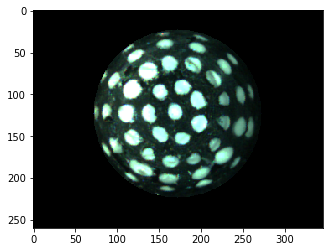

In [23]:
#Visualize events at switching states
hf = h5py.File(h5_file_name, 'r+')
indx = 9919
plt.imshow(hf['frames_augmented'][indx]/255)
print(hf['contact_status_augmented'][indx])
plt.show
hf.close()

[5812, 252, 248, 233, 247, 236, 248, 233, 247, 236, 248, 233, 247, 236, 248, 233, 247, 236]


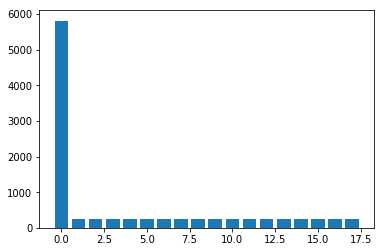

In [24]:
#analyze classes
hf = h5py.File(h5_file_name, 'r+')
counter = [0] * 18

for i in range(len(hf['contact_status_augmented'])):
    idx = int(hf['contact_status_augmented'][i])
    counter[idx] = counter[idx] + 1

print(counter)
plt.bar(range(0,18),counter)
hf.close()

In [25]:
#Equalize representation of classes
hf = h5py.File(h5_file_name, 'r+')
def equalize_representation(hf_file, class_counter, n_classes=6):
    for i in range(1, len(hf_file['frames_augmented'])):
        idx = int(hf['contact_status_augmented'][i])
        
        if (np.random.rand() < (float(min(counter[1:])) / counter[idx])):
            if 'frames_augmented_equalized' in hf_file.keys():
                hf_file['frames_augmented_equalized'].resize(len(hf_file['frames_augmented_equalized']) + 1, axis=0)
                hf_file["frames_augmented_equalized"][len(hf_file['frames_augmented_equalized'])-1] = hf_file['frames_augmented'][i]

                hf_file['contact_status_augmented_equalized'].resize(len(hf_file['contact_status_augmented_equalized']) + 1, axis=0)
                hf_file["contact_status_augmented_equalized"][len(hf_file['contact_status_augmented_equalized'])-1] = hf_file['contact_status_augmented'][i]
            else:
                hf_file.create_dataset('frames_augmented_equalized', data=[hf_file['frames_augmented'][i]], maxshape=(None,None, None, None))
                hf_file.create_dataset('contact_status_augmented_equalized', data=[hf_file['contact_status_augmented'][i]], maxshape=(None,))

equalize_representation(hf, counter)

[1453, 63, 63, 60, 62, 63, 63, 61, 62, 50, 61, 49, 61, 60, 61, 63, 62, 63]


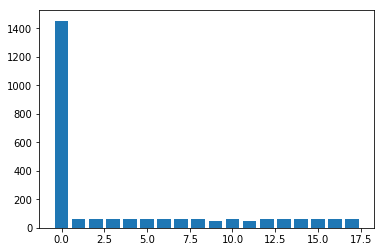

In [26]:
#analyze classes
hf = h5py.File(h5_file_name, 'r+')
counter = [0] * 18

for i in range(len(hf['contact_status'])):
    idx = int(hf['contact_status'][i])
    counter[idx] = counter[idx] + 1

print(counter)
plt.bar(range(0,18),counter)
hf.close()

In [27]:
#Equalize representation of classes
hf = h5py.File(h5_file_name, 'r+')
def equalize_representation(hf_file, class_counter, n_classes=6):
    for i in range(1, len(hf_file['frames'])):
        idx = int(hf['contact_status'][i])
        
        if (np.random.rand() < (float(min(counter[1:])) / counter[idx])):
            if 'frames_augmented_equalized' in hf_file.keys():
                hf_file['frames_augmented_equalized'].resize(len(hf_file['frames_augmented_equalized']) + 1, axis=0)
                hf_file["frames_augmented_equalized"][len(hf_file['frames_augmented_equalized'])-1] = hf_file['frames'][i]

                hf_file['contact_status_augmented_equalized'].resize(len(hf_file['contact_status_augmented_equalized']) + 1, axis=0)
                hf_file["contact_status_augmented_equalized"][len(hf_file['contact_status_augmented_equalized'])-1] = hf_file['contact_status'][i]
            else:
                hf_file.create_dataset('frames_augmented_equalized', data=[hf_file['frames'][i]], maxshape=(None,None, None, None))
                hf_file.create_dataset('contact_status_augmented_equalized', data=[hf_file['contact_status'][i]], maxshape=(None,))

equalize_representation(hf, counter)

[287, 281, 283, 283, 278, 281, 278, 282, 281, 284, 286, 282, 279, 281, 280, 286, 276, 285]


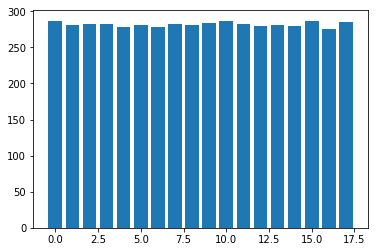

In [28]:
#analyze classes
hf = h5py.File(h5_file_name, 'r+')
new_counter = [0] * 18

for i in range(len(hf['contact_status_augmented_equalized'])):
    idx = int(hf['contact_status_augmented_equalized'][i])
    new_counter[idx] = new_counter[idx] + 1

print(new_counter)
plt.bar(range(0,18),new_counter)
hf.close()

[1453, 63, 63, 60, 62, 63, 63, 61, 62, 50, 61, 49, 61, 60, 61, 63, 62, 63]


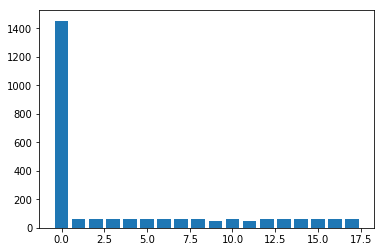

In [29]:
## RAW DATA
#Equalize representation of classes
hf = h5py.File(h5_file_name, 'r+')
def equalize_representation(hf_file, class_counter, n_classes=6):
    for i in range(1, len(hf_file['frames'])):
        idx = int(hf['contact_status'][i])
        
        if (np.random.rand() < (float(min(counter[1:])) / counter[idx])):
            if 'frames_equalized' in hf_file.keys():
                hf_file['frames_equalized'].resize(len(hf_file['frames_equalized']) + 1, axis=0)
                hf_file["frames_equalized"][len(hf_file['frames_equalized'])-1] = hf_file['frames'][i]

                hf_file['contact_status_equalized'].resize(len(hf_file['contact_status_equalized']) + 1, axis=0)
                hf_file["contact_status_equalized"][len(hf_file['contact_status_equalized'])-1] = hf_file['contact_status'][i]
            else:
                hf_file.create_dataset('frames_equalized', data=[hf_file['frames'][i]], maxshape=(None,None, None, None))
                hf_file.create_dataset('contact_status_equalized', data=[hf_file['contact_status'][i]], maxshape=(None,))

equalize_representation(hf, counter)

#analyze classes
hf = h5py.File(h5_file_name, 'r+')
counter = [0] * 18

for i in range(len(hf['contact_status'])):
    idx = int(hf['contact_status'][i])
    counter[idx] = counter[idx] + 1

print(counter)
plt.bar(range(0,18),counter)
hf.close()


[99, 101, 97, 94, 87, 101, 106, 100, 93, 100, 104, 98, 104, 98, 99, 94, 98, 94]


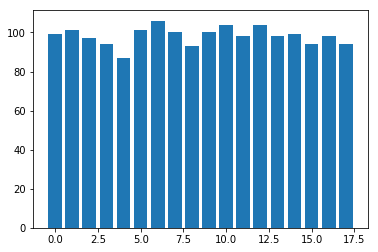

In [30]:

#Equalize representation of classes
hf = h5py.File(h5_file_name, 'r+')
def equalize_representation(hf_file, class_counter, n_classes=6):
    for i in range(1, len(hf_file['frames'])):
        idx = int(hf['contact_status'][i])
        
        if (np.random.rand() < (float(min(counter[1:])) / counter[idx])):
            if 'frames_equalized' in hf_file.keys():
                hf_file['frames_equalized'].resize(len(hf_file['frames_equalized']) + 1, axis=0)
                hf_file["frames_equalized"][len(hf_file['frames_equalized'])-1] = hf_file['frames'][i]

                hf_file['contact_status_equalized'].resize(len(hf_file['contact_status_equalized']) + 1, axis=0)
                hf_file["contact_status_equalized"][len(hf_file['contact_status_equalized'])-1] = hf_file['contact_status'][i]
            else:
                hf_file.create_dataset('frames_equalized', data=[hf_file['frames'][i]], maxshape=(None,None, None, None))
                hf_file.create_dataset('contact_status_equalized', data=[hf_file['contact_status'][i]], maxshape=(None,))

equalize_representation(hf, counter)

#analyze classes
hf = h5py.File(h5_file_name, 'r+')
new_counter = [0] * 18

for i in range(len(hf['contact_status_equalized'])):
    idx = int(hf['contact_status_equalized'][i])
    new_counter[idx] = new_counter[idx] + 1

print(new_counter)
plt.bar(range(0,18),new_counter)
hf.close()

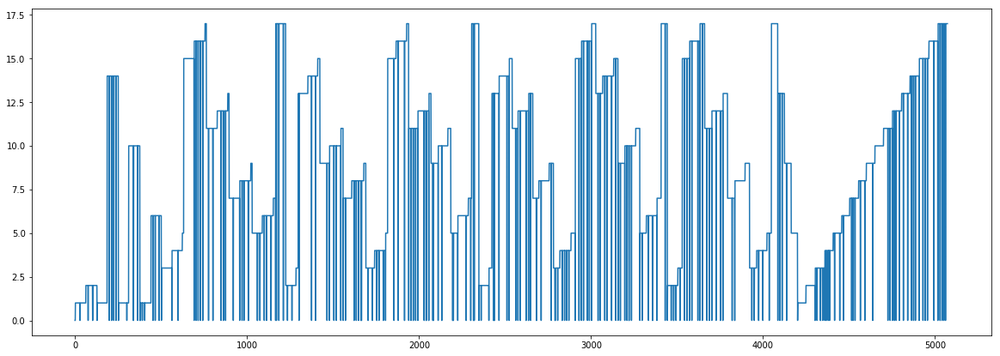

In [31]:
hf = h5py.File(h5_file_name, 'r')
plt.figure(figsize=(20,7))
plt.plot(hf["contact_status_augmented_equalized"])
plt.show()
hf.close()

17.0


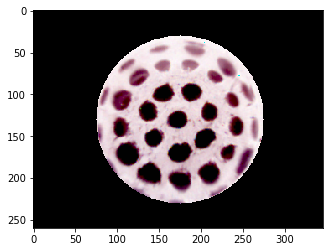

In [32]:
#Visualize events at switching states
hf = h5py.File(h5_file_name, 'r+')
# indx = 9000
indx = (hf['frames_augmented_equalized'].shape[0]) - 1
plt.imshow(hf['frames_augmented_equalized'][indx])
print(hf['contact_status_augmented_equalized'][indx])
plt.show
hf.close()

In [33]:
hf = h5py.File(h5_file_name, 'r+')
print(len(hf['contact_status_augmented_equalized']))

5073


In [34]:
hf.close()

[2341, 2370, 2400, 2429, 2458]


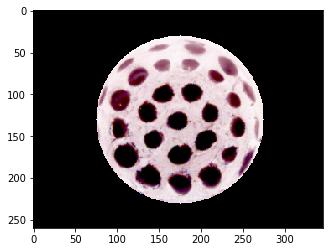

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


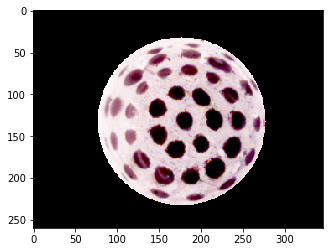

In [35]:
#compare augmented data with regular images
hf = h5py.File(h5_file_name, 'r')
desired_class = 17
idx = 0
increment = 10

edge_locations = np.where(np.multiply(np.diff(hf['contact_status'])>0, np.equal(np.array(hf['contact_status']), desired_class * np.ones(shape=np.shape(hf['contact_status'])))[1:] ))
edge_locations = np.array(edge_locations)[0].tolist()
print(edge_locations)

plt.imshow(hf['frames'][edge_locations[idx]+increment])
plt.show()

idx = 5

edge_locations_augmented = np.where(np.multiply(np.diff(hf['contact_status_augmented'])>0, np.equal(np.array(hf['contact_status_augmented']), desired_class * np.ones(shape=np.shape(hf['contact_status_augmented'])))[1:] ))
edge_locations_augmented = np.array(edge_locations_augmented)[0].tolist()
print(edge_locations_augmented)

plt.imshow(hf['frames_augmented'][edge_locations_augmented[idx]+increment])
plt.show()

hf.close()

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


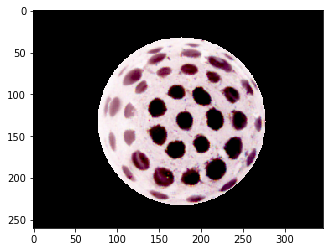

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


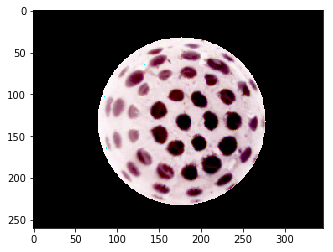

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


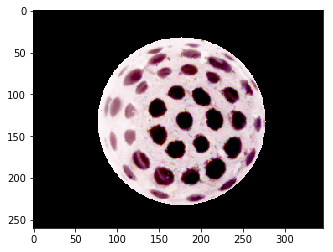

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


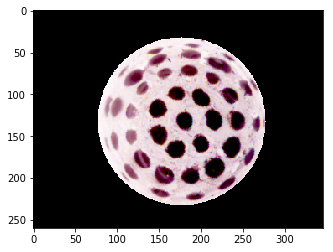

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


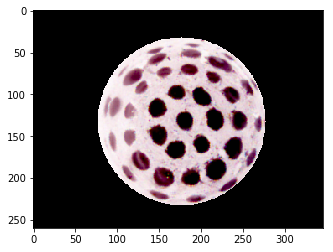

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


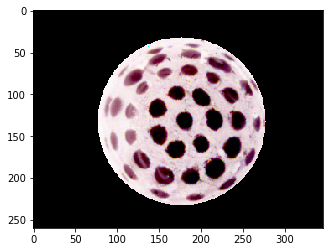

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


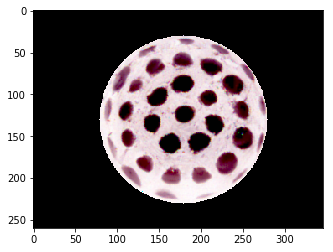

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


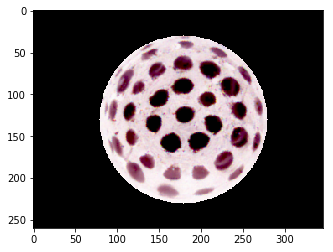

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


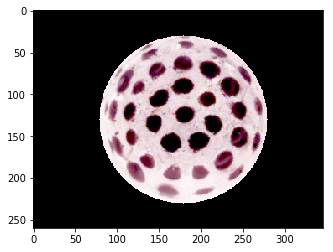

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


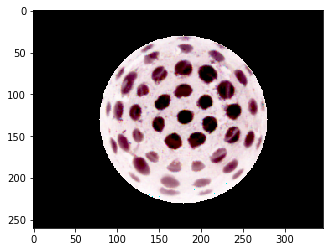

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


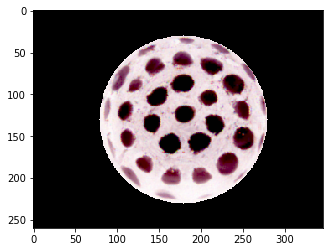

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


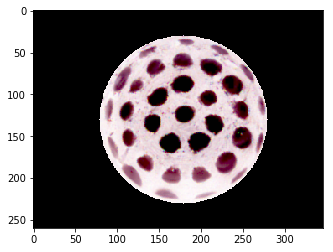

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


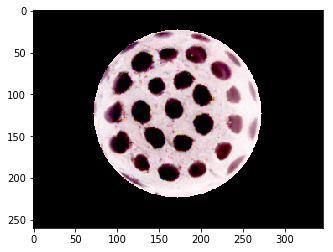

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


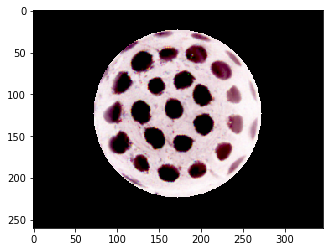

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


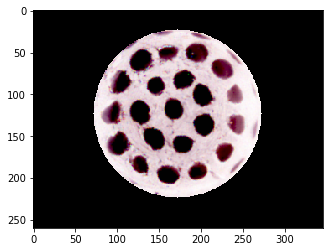

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


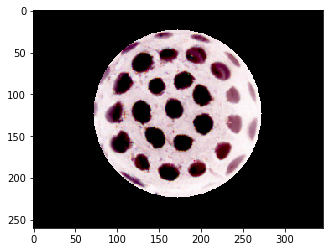

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


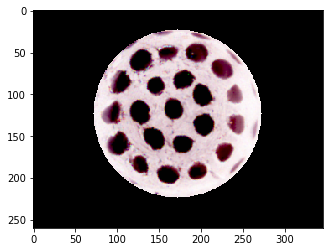

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


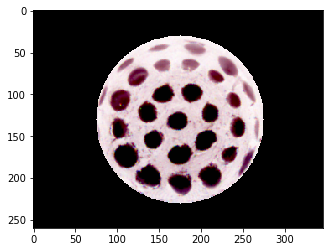

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


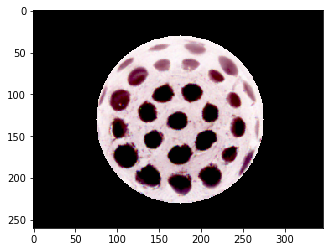

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


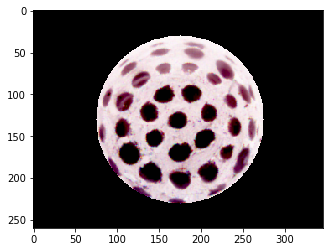

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


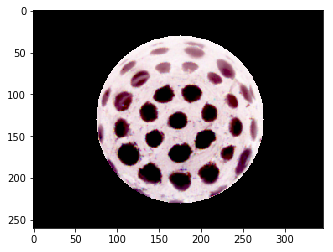

[1791, 2699, 2719, 2749, 2778, 2807, 4474, 5405, 5438, 5442, 5461, 5490, 7157, 7186, 8115, 8145, 8173, 8641, 8670, 9600, 9629, 9658]


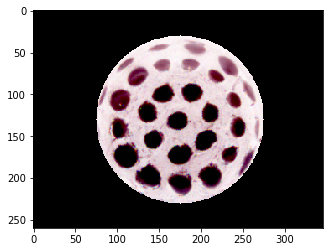

In [36]:
#compare augmented data with regular images
hf = h5py.File(h5_file_name, 'r')
desired_class = 17
increment = 5

for idx in range(len(edge_locations_augmented)):

    edge_locations_augmented = np.where(np.multiply(np.diff(hf['contact_status_augmented'])>0, np.equal(np.array(hf['contact_status_augmented']), desired_class * np.ones(shape=np.shape(hf['contact_status_augmented'])))[1:] ))
    edge_locations_augmented = np.array(edge_locations_augmented)[0].tolist()
    print(edge_locations_augmented)

    plt.imshow(hf['frames_augmented'][edge_locations_augmented[idx]+increment])
    plt.show()

hf.close()

In [37]:
hf = h5py.File(h5_file_name, 'r+')
# print(np.mean(hf['event_images'][:,:,:,0]))
# print(np.std(hf['event_images'][:,:,:,0]))
# print(np.max(hf['event_images'][:,:,:,0]))
# print(np.min(hf['event_images'][:,:,:,0]))
# hf.close

In [38]:
hf.keys()

[u'contact_status',
 u'contact_status_augmented',
 u'contact_status_augmented_equalized',
 u'contact_status_equalized',
 u'frames',
 u'frames_augmented',
 u'frames_augmented_equalized',
 u'frames_equalized',
 u'time_steps']

In [63]:
print(np.mean(hf['frames'][:,:,:,0]))
print(np.std(hf['frames'][:,:,:,0]))
print(np.max(hf['frames'][:,:,:,0]))
print(np.min(hf['frames'][:,:,:,0]))

21.8767
52.2954
255.0
0.0


In [65]:
print(np.mean(hf['frames_augmented'][:,:,:,0]))
print(np.std(hf['frames_augmented'][:,:,:,0]))
print(np.max(hf['frames_augmented'][:,:,:,0]))
print(np.min(hf['frames_augmented'][:,:,:,0]))

21.8769
52.2966
255.0
0.0


In [66]:
print(np.mean(hf['frames_augmented_equalized'][:,:,:,0]))
print(np.std(hf['frames_augmented_equalized'][:,:,:,0]))
print(np.max(hf['frames_augmented_equalized'][:,:,:,0]))
print(np.min(hf['frames_augmented_equalized'][:,:,:,0]))

22.7271
54.2719
255.0
0.0


In [39]:
hf.close()

## Handling H5py file

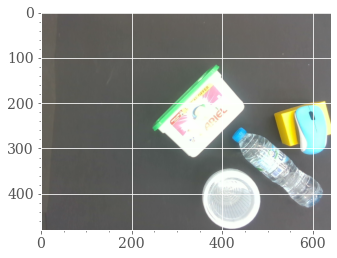

In [69]:
#hf = h5py.File('output.hdf5', 'r')
#fig = plt.figure()
#d435_frames = hf['d435_frames']
#plt.imshow(d435_frames[0])
#plt.show()
#hf.close()

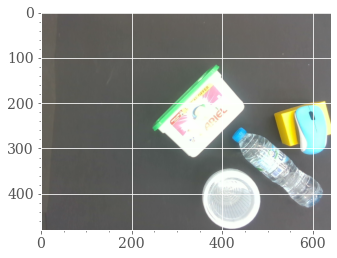

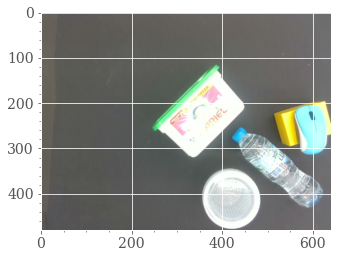

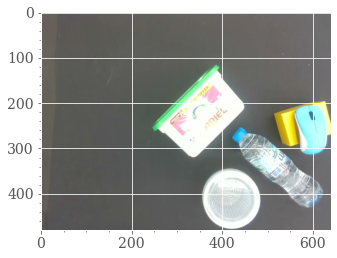

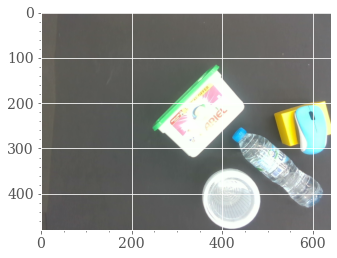

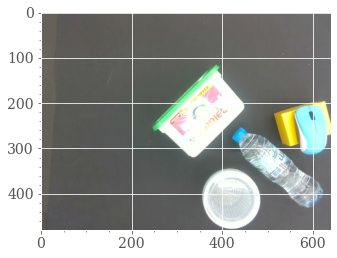

...

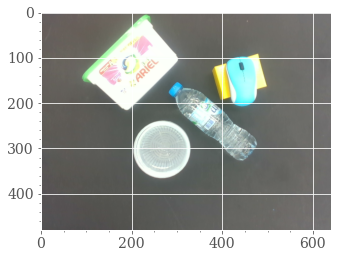

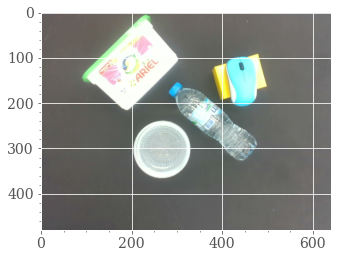

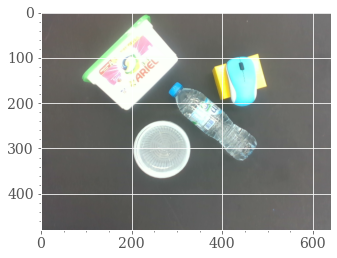

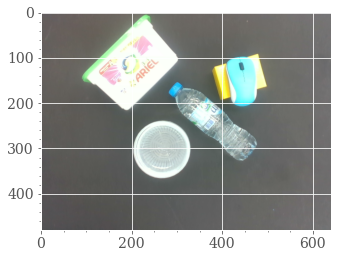

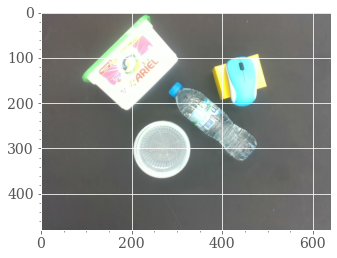

In [95]:
hf = h5py.File('output.hdf5', 'r')
fig = plt.figure()
d435_frames = hf['d435_frames']
for l in range(82):
    plt.imshow(d435_frames[l])
    plt.show()
hf.close()